In [2]:
#import models
import numpy as np
import h5py
import sys, os
import rospy
import rosbag
import math
from scipy.interpolate import interp1d
import h5py
import matplotlib.pylab as plt
import time 

In [3]:
#parameters of processing
frequency = 30 #Hz
bag_file_name = '/data/dataset_ENVTACT_new2.bag'#'/home/hussain/me/projects/tactile/data/dataset_ENVTACT_new2.bag'
time_window_size = 6
examples_per_edge = 1

bag_file = rosbag.Bag(bag_file_name)


In [4]:
events = []
contact_status = []
contact_status_ts = []
contact_case = [] #0:No contact 1: center, 2:remainder of contacts as in list_of_rotations
contact_case_ts = []

contact_case_updated = []
contact_case_updated_ts = []

event_packet_size = []
event_packet_size_ts = []
contact_angle = []


#generate labels
possible_angle = [0.0174532925, 0.034906585, 0.0523598776, 0.075, 0.095, 0.115, 0.135, 0.15]#
N_examples = 17
list_of_rotations = [[0, 0, 0]]

for i in range(1, N_examples):
    theta = i * 2 * math.pi/(N_examples - 1)
    for phi in possible_angle:
        rx = phi * math.cos(theta)
        ry = phi * math.sin(theta)
        rotvec = [rx, ry, 0]
        list_of_rotations.append(rotvec)

print(len(list_of_rotations))
print(list_of_rotations)

129
[[0, 0, 0], [0.016124739715682745, 0.006679085879971878, 0], [0.03224947943136549, 0.013358171759943756, 0], [0.048374219239436196, 0.02003725767818398, 0], [0.06929096493834651, 0.02870125742738173, 0], [0.08776855558857224, 0.03635492607468353, 0], [0.10624614623879798, 0.044008594721985324, 0], [0.12472373688902372, 0.05166226336928712, 0], [0.13858192987669302, 0.05740251485476346, 0], [0.01234134148078231, 0.012341341480782309, 0], [0.02468268296156462, 0.024682682961564617, 0], [0.03702402451305761, 0.037024024513057606, 0], [0.053033008588991064, 0.05303300858899106, 0], [0.06717514421272203, 0.06717514421272201, 0], [0.08131727983645297, 0.08131727983645295, 0], [0.09545941546018392, 0.09545941546018391, 0], [0.10606601717798213, 0.10606601717798211, 0], [0.006679085879971879, 0.016124739715682745, 0], [0.013358171759943758, 0.03224947943136549, 0], [0.020037257678183984, 0.048374219239436196, 0], [0.028701257427381735, 0.06929096493834651, 0], [0.03635492607468353, 0.08776

In [5]:
from tqdm.auto import tqdm
for topic, msg, t in tqdm(bag_file.read_messages(topics=['/contact_status', '/dvs/events', '/contact_angle'])):
    if topic == '/dvs/events':
        for e in msg.events:
            event = [e.x, e.y, e.ts.to_nsec(), e.polarity]
            events.append(event)
        event_packet_size.append(len(msg.events))
        event_packet_size_ts.append(t.to_nsec())
        event_topic = True    
    elif topic == '/contact_status':
        contact_status.append(msg.data)
        contact_status_ts.append(t.to_nsec())
    elif topic == '/contact_angle':
        contact_angle.append([msg.x, msg.y, msg.z])
        if (len(contact_status) > 1):
            if (contact_status[-1] == True):
                best_rot_diff = 100
                best_rot_idx = 1
                i = 1
                for rot in list_of_rotations:
                    diff_vals = np.sqrt( np.power(rot[0] - msg.x, 2) +  np.power(rot[1] - msg.y, 2) + np.power(rot[2] - msg.z, 2) )
                    if best_rot_diff > diff_vals:
                        best_rot_diff = diff_vals
                        best_rot_idx = i
                    i = i + 1

                contact_case.append(best_rot_idx)
                contact_case_ts.append(t.to_nsec())
            else:
                contact_case.append(0)
                contact_case_ts.append(t.to_nsec())
        else:
            contact_case.append(0)
            contact_case_ts.append(t.to_nsec())
        
        # Updated contact status according to no. of events
        
            
#print(events)
bag_file.close()

0it [00:00, ?it/s]

In [5]:
f = interp1d(contact_case_ts, contact_case, kind='previous')
contact_case_ts_int = np.arange(min(contact_case_ts), max(contact_case_ts), int(1e9/frequency))
contact_case_int = f(contact_case_ts_int)

In [1]:
plt.figure(figsize=(140,40))
plt.plot(contact_case_ts_int, contact_case_int)
plt.show()
print(len(contact_case_ts_int))

NameError: name 'plt' is not defined

In [8]:
case_span = 2.66e9
find_ts_idx = lambda ts: np.searchsorted(contact_status_ts, ts)

def look_ahead_big(ts, idx_ts):
    fin_ts = ts + case_span
    fin_idx = find_ts_idx(fin_ts)
    print(fin_idx)
    if contact_status[fin_idx]:
        #look further
        more = True
        fin_idx_ = fin_idx 
        while more:
            fin_idx_ += 1
            if fin_idx_ - fin_idx > 25:
                print('warning more than 25 idx away from init_ts + case_span')
            if contact_status[fin_idx_]:
                continue
            else:
                more = False
        print(f'was before case ended by {fin_idx_ - fin_idx} indexes')
        fin_idx = fin_idx_ - 1
    else:
        #look backwards
        more = True
        fin_idx_ = fin_idx 
        while more:
            fin_idx_ -= 1
            if not contact_status[fin_idx_]:
                continue
            else:
                more = False
        print(f'was ahead case ended by {fin_idx - fin_idx} indexes')
        fin_idx = fin_idx_ + 1
        
    return contact_status_ts[fin_idx]


def find_case(ts):
    idx = find_ts_idx(ts)
    best_rot_diff = 100
    best_rot_idx = 1
    i = 1
    x, y, z = contact_angle[idx]
    for rot in list_of_rotations:
        diff_vals = np.sqrt(np.power(rot[0] - x, 2) +  np.power(rot[1] - y, 2) + np.power(rot[2] - z, 2))
        if best_rot_diff > diff_vals:
            best_rot_diff = diff_vals
            best_rot_idx = i
        i = i + 1
    return best_rot_idx


i = 0 
cases_ts = []
cases_idx = []
cases = []
while i < len(contact_status):
    if contact_status[i]:
        init_ts = contact_status_ts[i]
        fin_ts = look_ahead_big(init_ts, i)
        fin_idx = find_ts_idx(fin_ts)
        case = find_case(np.mean([init_ts, fin_ts]))
        
        cases.append(case)
        cases_ts.append([init_ts, fin_ts])
        cases_idx.append([i, fin_idx])
        print(len(cases_ts), init_ts, fin_ts, (fin_ts - init_ts)*1e-9, i, fin_idx, case, '\n')
        i = fin_idx + 1
    else:
        i += 1

416
was ahead case ended by 0 indexes
1 1662378738268597072 1662378740888466220 2.6198691480000003 282 413 1 

663
was before case ended by 3 indexes
2 1662378743228413369 1662378745928494229 2.7000808600000004 530 665 1 

885
was ahead case ended by 0 indexes
3 1662378748308327497 1662378750836139442 2.5278119450000003 784 877 1 

1136
was ahead case ended by 0 indexes
4 1662378753308512546 1662378755868273794 2.559761248 1002 1130 1 

1383
was before case ended by 1 indexes
5 1662378758251080543 1662378760928476102 2.6773955590000003 1249 1383 1 

1585
was ahead case ended by 0 indexes
6 1662378762308217783 1662378764868165283 2.5599475000000003 1452 1580 2 

1834
was ahead case ended by 0 indexes
7 1662378767268328555 1662378769948127249 2.679798694 1700 1834 2 

2084
was before case ended by 1 indexes
8 1662378772268509465 1662378774948096529 2.679587064 1950 2084 2 

2334
was before case ended by 1 indexes
9 1662378777268214868 1662378779948277480 2.680062612 2200 2334 2 

2588
wa

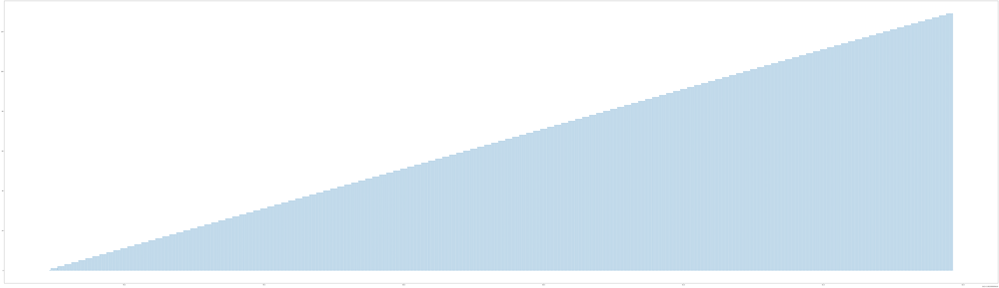

In [9]:
%matplotlib inline
contact_case_alt = np.zeros(len(contact_status))
for i, case in enumerate(cases):
    contact_case_alt[cases_idx[i][0]:cases_idx[i][1] + 1] = case
    
plt.figure(figsize=(140, 40))
plt.plot(contact_status_ts, contact_case_alt)

In [68]:
f_case = interp1d(contact_status_ts, contact_case_alt, kind='previous')
contact_case_ts_alt_int = np.arange(min(contact_status_ts), max(contact_status_ts), int(1e9/frequency))

contact_case_alt_int = f_case(contact_case_ts_alt_int)

In [12]:
def find_interp_idx(ts):
    return np.where(ts - contact_case_ts_alt_int < 0)[0][0]

In [56]:
cases_int_idx = []

for i, case_ts in enumerate(cases_ts):
    case_int_idx = list(map(find_interp_idx, case_ts))
    cases_int_idx.append(case_int_idx)

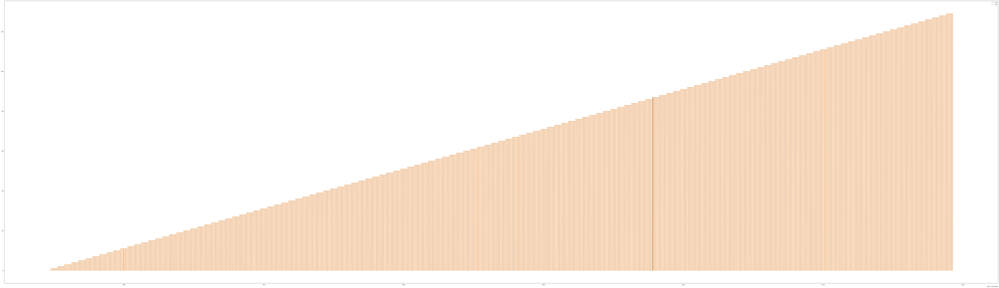

In [14]:
plt.figure(figsize=(140, 40))
plt.plot(contact_case_ts_alt_int, contact_case_alt_int, label='alt')
plt.plot(contact_case_ts_int, contact_case_int, label='int')
plt.legend()

In [26]:
ts = np.array(events)[:, 2]
ts

array([1662378732593736638, 1662378732595119638, 1662378732595269638, ...,
       1662381972813252638, 1662381972813365638, 1662381972813477638])

In [17]:
np.histogram([1, 2, 3, 4, 5, 3, 3, 1, 2])

(array([2, 0, 2, 0, 0, 3, 0, 1, 0, 1]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))

In [16]:
ts.shape

(11138715,)

In [18]:
((ts[-1] - ts[0]) / 1e5)*1e-9

0.03240219741

In [19]:
hist.shape

(100000,)

In [20]:
11138715/1e7

1.1138715

In [21]:
from scipy.signal import find_peaks
peaks_fixed_window, _ = find_peaks(hist, distance=70)
peaks_fixed_window_ts = bin_edges[peaks_fixed_window]
peaks_fixed_window.shape

(1292,)

In [84]:
hist.max() * 0.2

750.2

/tmp/ipykernel_8757/2894618581.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10 , 10))


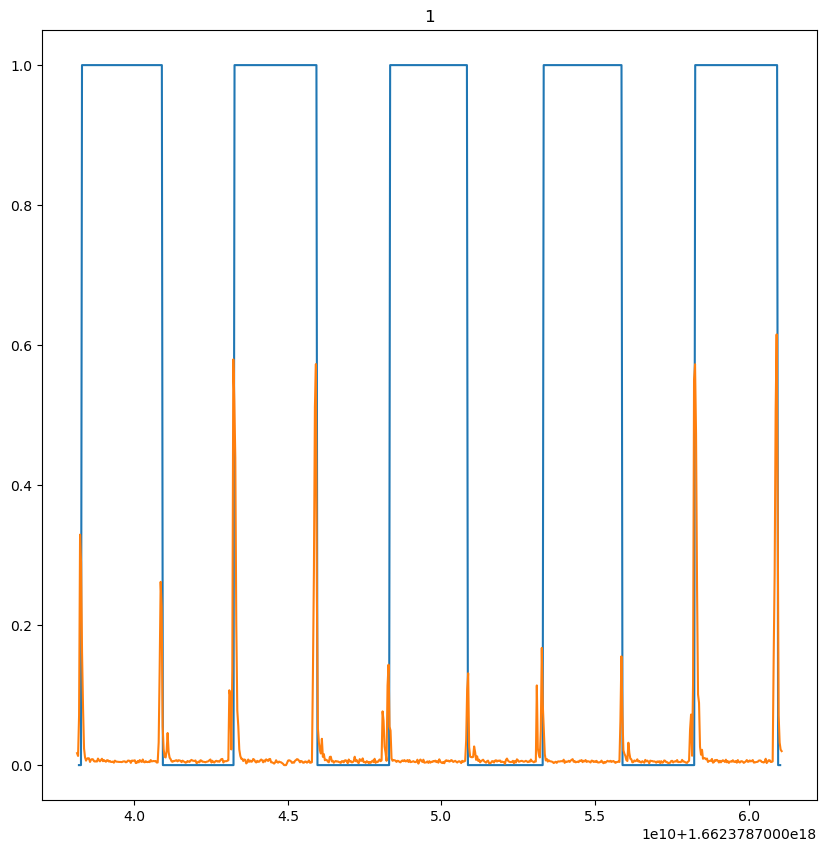

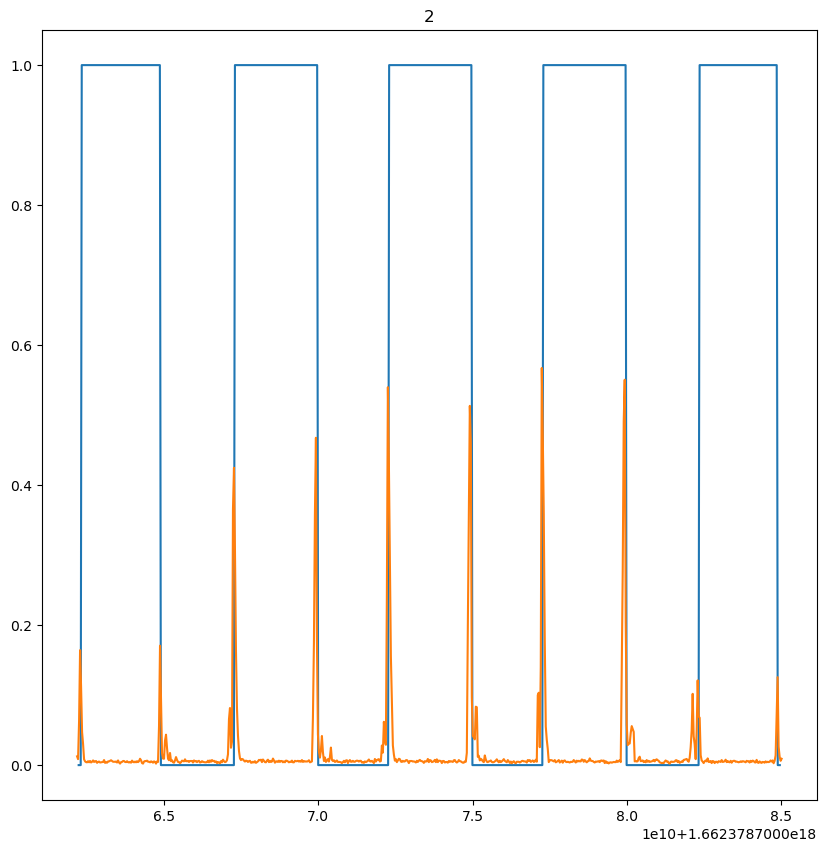

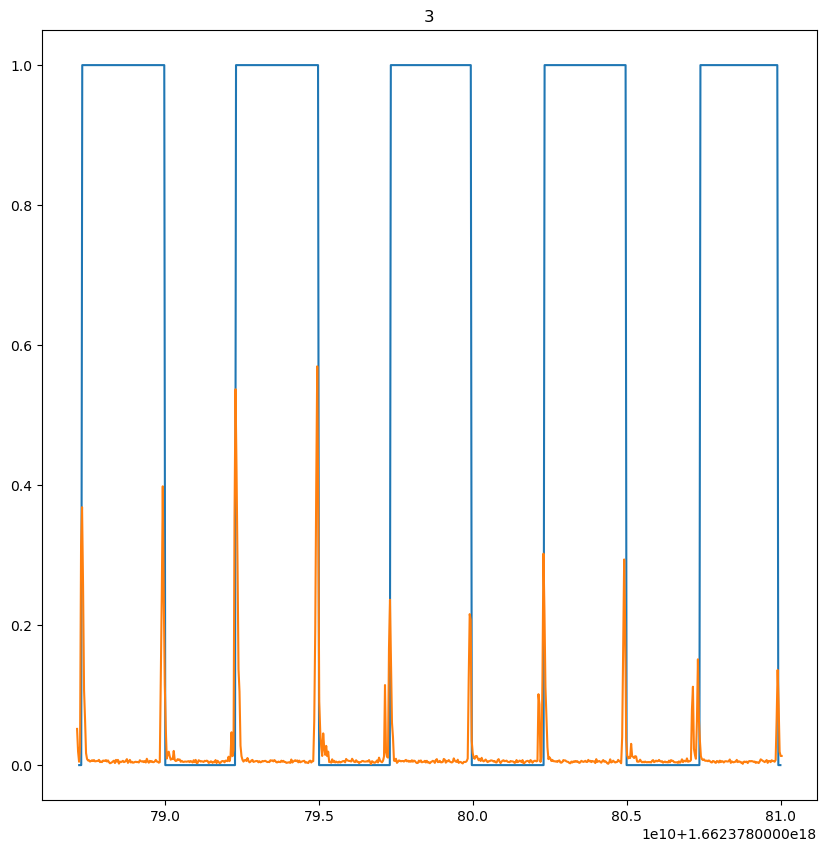

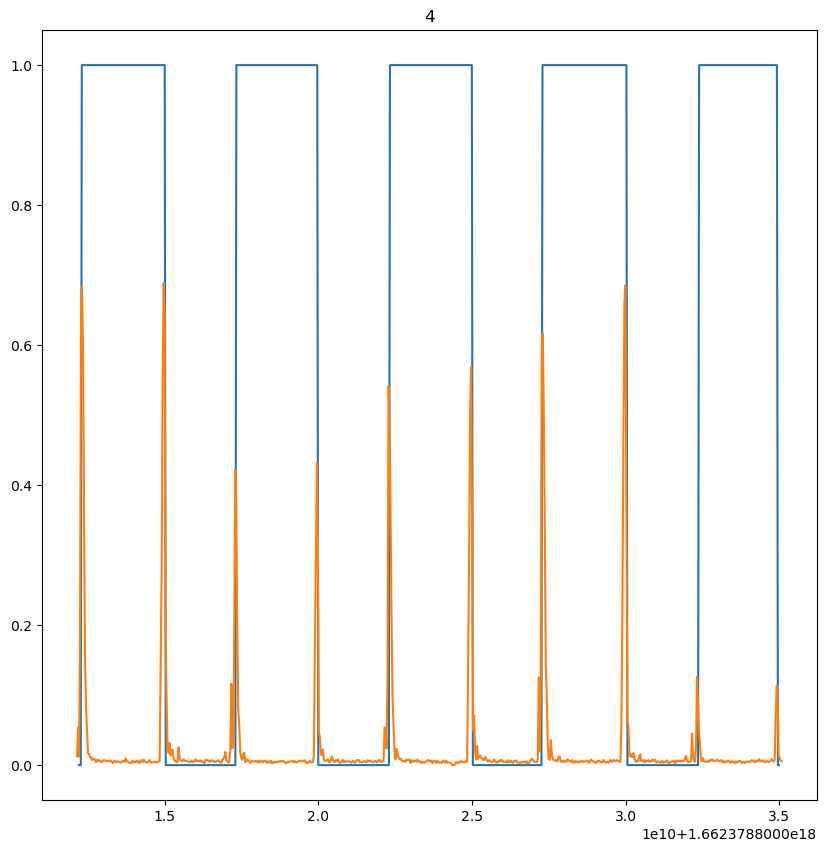

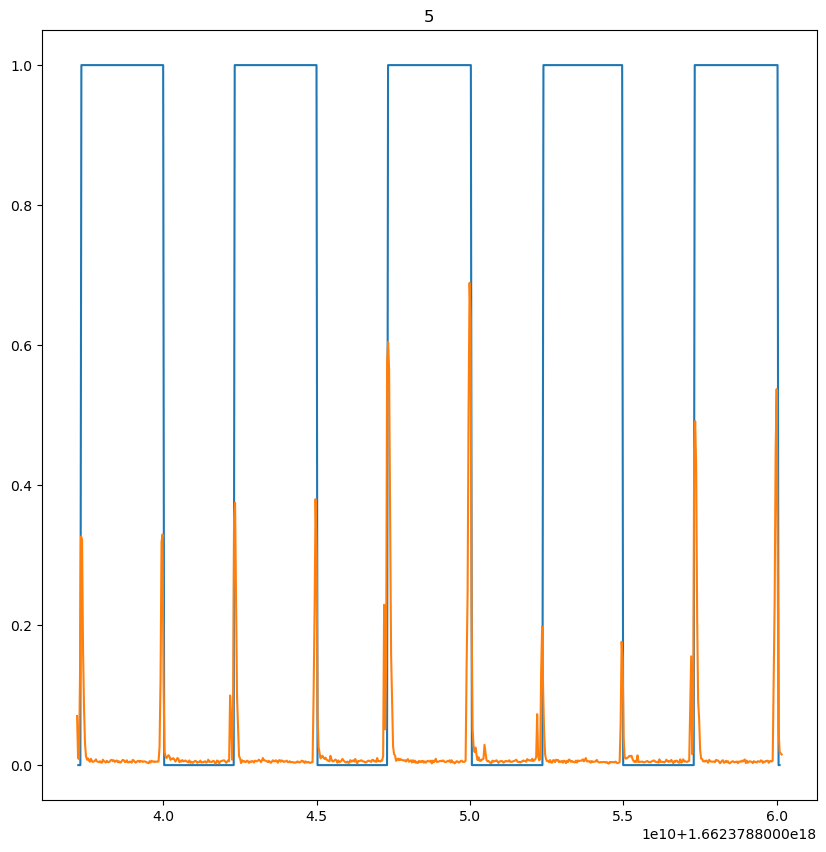

...

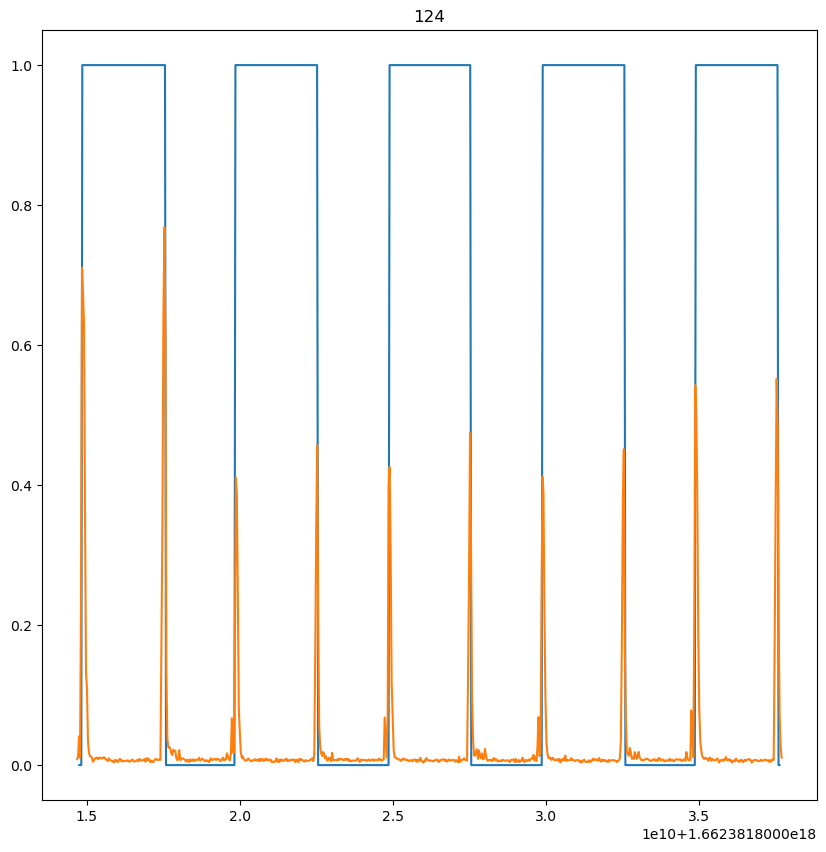

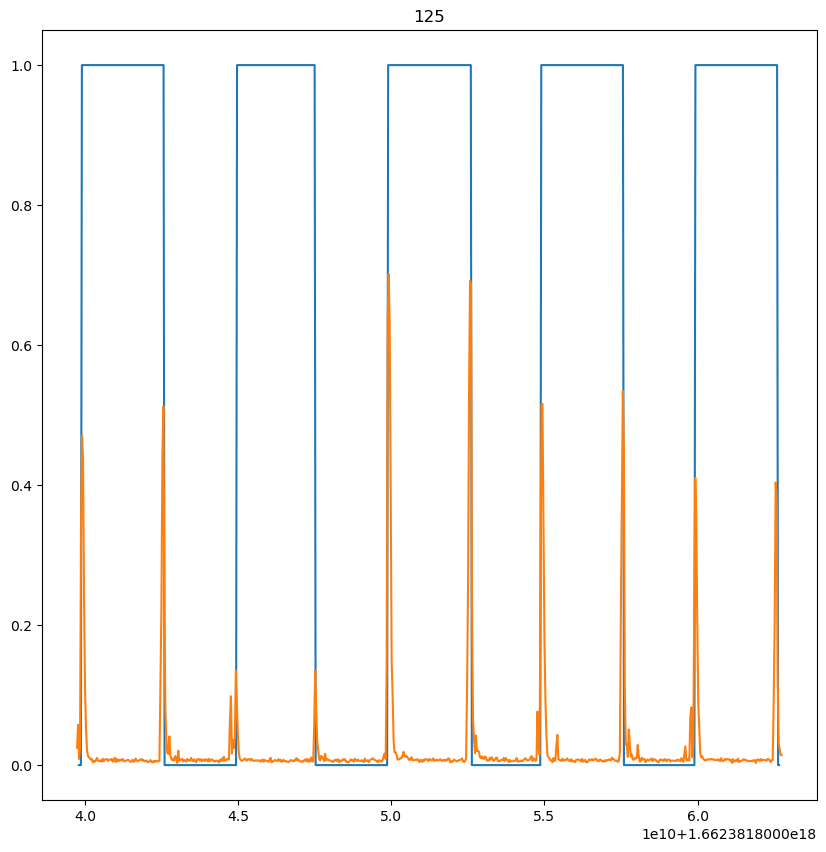

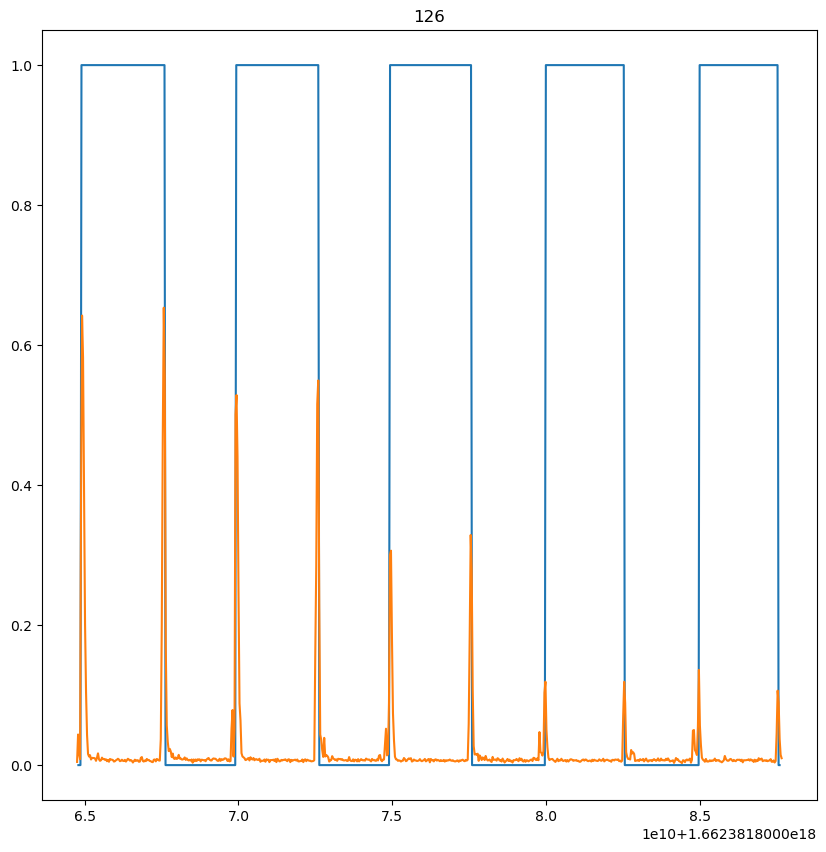

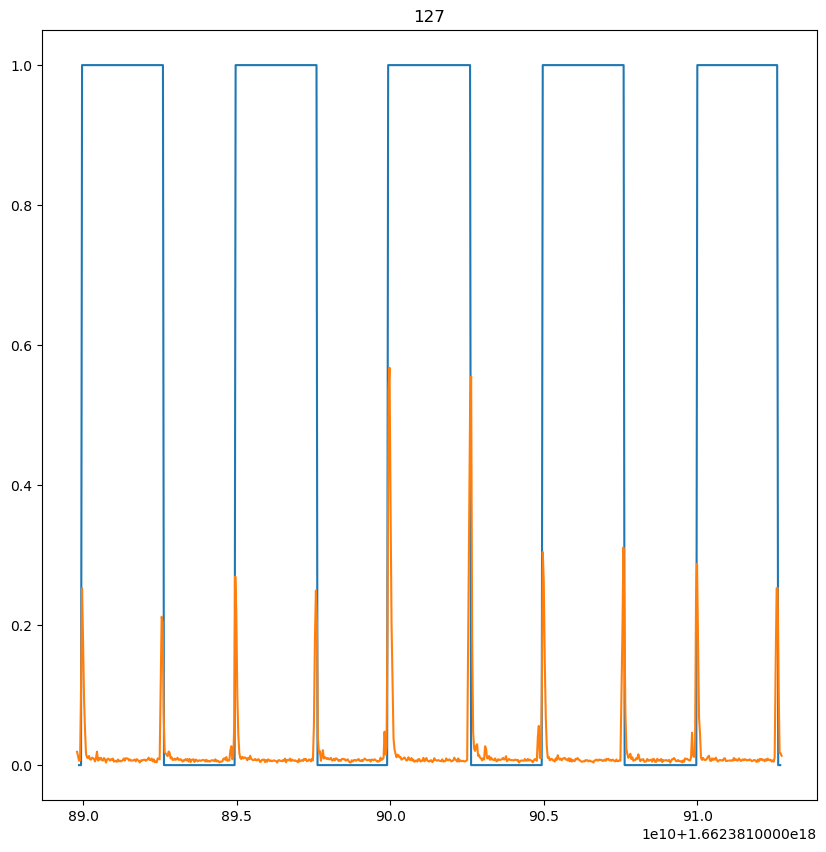

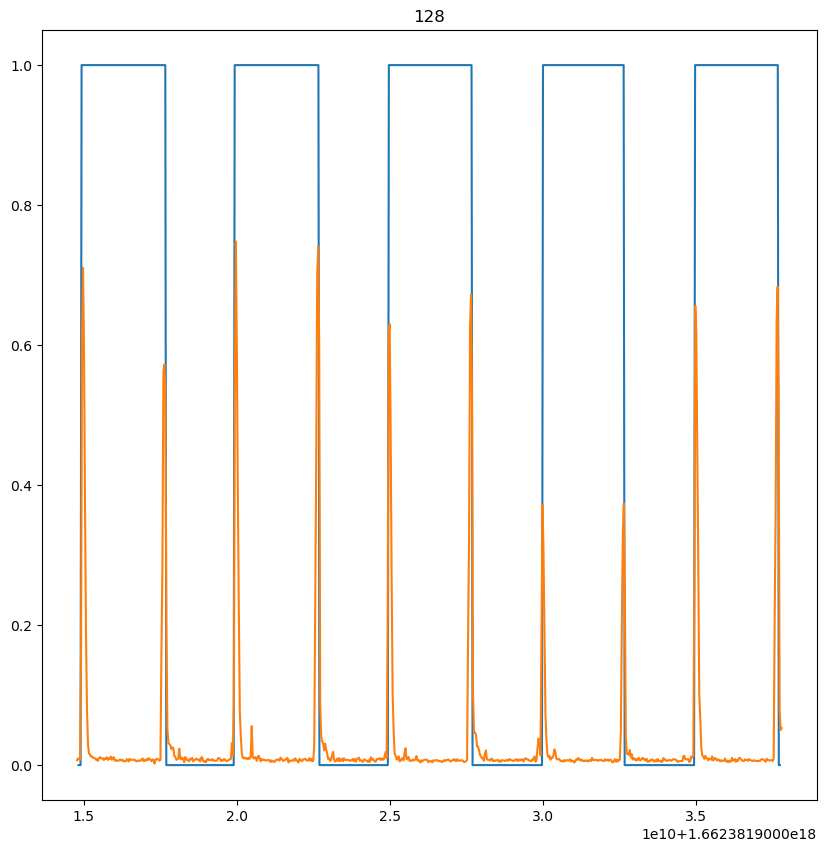

In [82]:
for i in range(1, 129):
    plot_case(i-1)
    plt.title(str(i))

In [72]:
1e10 + 1.66e18

1.66000001e+18

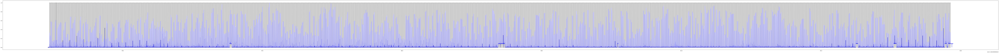

In [55]:
plt.figure(figsize=(200, 10))
plt.plot(contact_case_ts_alt_int, contact_case_alt_int > 0, color='black')
plt.plot(bin_edges[:-1], (hist - hist.min()) / (hist.max() - hist.min()), c='blue')
#plt.scatter(bin_edges[:-1][peaks_fixed_window], hist[peaks_fixed_window] / hist.max(), c='r',marker='x')
#plt.scatter(bin_edges[:-1][spur], hist[spur] / hist.max(), c='r')


In [23]:
cases_ts_flat = np.array(cases_ts).reshape(-2, 1)
cases_ts_flat

array([[1662378738268597072],
       [1662378740888466220],
       [1662378743228413369],
       ...,
       [1662381957682898326],
       [1662381960025874129],
       [1662381962642994079]])

In [24]:
peaks_fixed_window_ts.reshape(-1, 1).astype(np.uint64)

array([[1662378733112171776],
       [1662378735607141120],
       [1662378738231719168],
       ...,
       [1662381965036950272],
       [1662381967369908480],
       [1662381970998954496]], dtype=uint64)

In [25]:
(cases_ts_flat-1662381965036950272)*1e-9

array([[-3.22676835e+03],
       [-3.22414848e+03],
       [-3.22180854e+03],
       ...,
       [-7.35405195e+00],
       [-5.01107614e+00],
       [-2.39395619e+00]])

In [26]:
closest = []
deltas = []
for peak_ts in peaks_fixed_window_ts:
    delta_peak = cases_ts_flat - peak_ts
    abs_delta_peak = np.abs(delta_peak)
    
    closest_case = np.argmin(abs_delta_peak)
    delta = delta_peak[closest_case][0]
    
    deltas.append(delta)
    closest.append(closest_case)
    

deltas = np.array(deltas)
abs_deltas = np.abs(deltas)

In [27]:
abs_deltas

array([5.15642522e+09, 2.66145587e+09, 3.68778240e+07, ...,
       2.39395610e+09, 4.72691430e+09, 8.35596032e+09])

In [28]:
deltas

array([ 5.15642522e+09,  2.66145587e+09,  3.68778240e+07, ...,
       -2.39395610e+09, -4.72691430e+09, -8.35596032e+09])

In [29]:
deltas

array([ 5.15642522e+09,  2.66145587e+09,  3.68778240e+07, ...,
       -2.39395610e+09, -4.72691430e+09, -8.35596032e+09])

<AxesSubplot:>

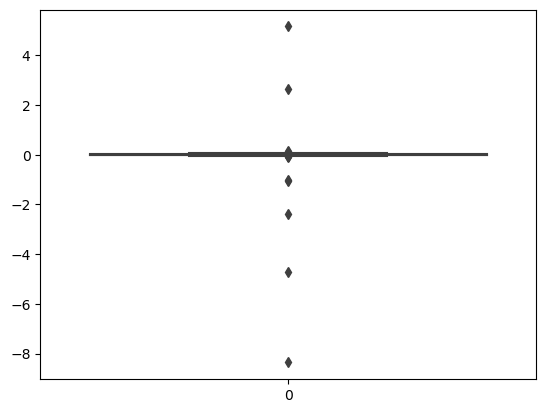

In [30]:
import seaborn as sns
sns.boxplot(deltas*1e-9)

In [31]:
np.abs(deltas)

array([5.15642522e+09, 2.66145587e+09, 3.68778240e+07, ...,
       2.39395610e+09, 4.72691430e+09, 8.35596032e+09])

<AxesSubplot:>

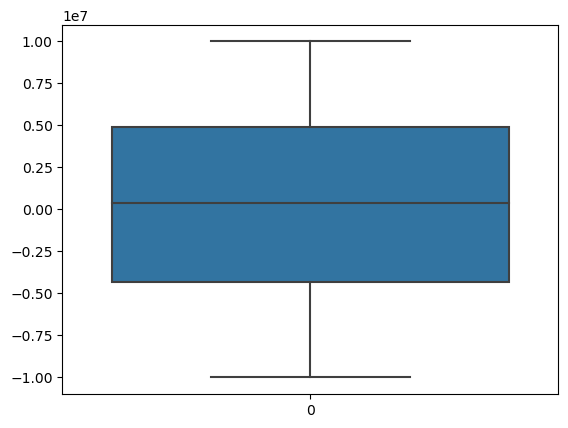

In [32]:
import seaborn as sns
sns.boxplot(deltas[np.abs(deltas) < 0.01e9])

In [33]:
sum(np.abs(deltas) > 0.1e9)

8

In [34]:
sum(deltas > 0)

666

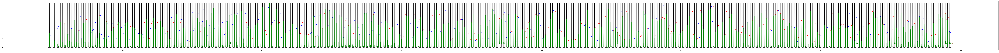

In [35]:
plt.figure(figsize=(200, 10))
plt.plot(contact_case_ts_alt_int, contact_case_alt_int > 0, color='black')
plt.plot(bin_edges[:-1], (hist - hist.min()) / (hist.max() - hist.min()), c='green')
plt.scatter(bin_edges[:-1][peaks_fixed_window][deltas >= 0], hist[peaks_fixed_window][deltas >= 0] / hist.max(), c='blue',marker='x')
plt.scatter(bin_edges[:-1][peaks_fixed_window][deltas < 0], hist[peaks_fixed_window][deltas < 0] / hist.max(), c='red',marker='x')

In [228]:
len(cases) / 5

129.0

In [ ]:
129

In [36]:
np.median(deltas)*1e-9

0.00085568

In [37]:
np.median(np.diff(ts))

27000.0

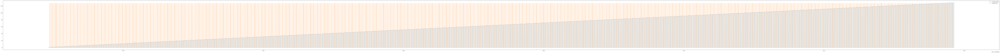

In [42]:
contact_case_diff_int = np.diff(contact_case_alt_int)
contact_case_diff_int = np.insert(contact_case_diff_int, 0, 0)
contact_rise_idx = np.where(contact_case_diff_int > 0.4)[0]

contact_rise_int = [0 for i in range(len(contact_case_int))]
for index in contact_rise_idx:
    contact_rise_int[index] = 128


plt.figure(figsize=(200, 10))
plt.plot(contact_case_ts_alt_int, contact_case_alt_int)
plt.plot(contact_case_ts_alt_int, contact_rise_int)
plt.legend(['contact_status', 'contact_rise'])
plt.show()

In [52]:
events = np.array(events)

In [170]:
def filter_events_by_time(time_of_contact, time_frame = 1e9):
    event_in_time_idx = np.where((ts > (
        time_of_contact - time_frame)) * (ts < time_of_contact))[0]
    # print(len(event_in_time_idx))
    #time_of_contact - time_frame < ts < time_of_contact
    #print(len(event_in_time_idx))
    if len(event_in_time_idx) < 5000:
        return False, []
    else:
        # print(event_in_time_idx)
        output_events = events[event_in_time_idx, :]
        return True, output_events


In [240]:
i=10
cases_int_idx[5*i:5*i+6]

[[7645, 7726],
 [7796, 7876],
 [7948, 8024],
 [8096, 8175],
 [8246, 8326],
 [8396, 8477]]

In [ ]:
for cas

In [172]:
label_contact_case = []
i = 0
event_arrays = []
dist_from_center = lambda x, y: np.sqrt((x - 173)**2 + (y - 130)**2)
circle_rad=90

for status_index in tqdm(contact_rise_idx):
    for j in range(-7, 8):
        time_step = contact_case_ts_alt_int[status_index + j]
        detect, event_array = filter_events_by_time(time_step)
        # print(event_array)
        if detect:
            in_circle = dist_from_center(event_array[:, 0], event_array[:, 1]) < circle_rad
            event_arrays.append(event_array[in_circle, :])
            label_contact_case.append(
                contact_case_alt_int[status_index + 1])
            break
    #print()

  0%|          | 0/645 [00:00<?, ?it/s]

In [25]:
!pwd

/home/hussain/tactile/src


In [173]:
len(label_contact_case)

437

In [36]:

cases_ts[i][0] + margin_ts

3324758395318419357

In [48]:
events=  np.array(events)

In [49]:
def filter_events_by_time(time_of_contact, time_frame = 1e9):
    event_in_time_idx = np.where((ts > (time_of_contact - time_frame)) * (ts < time_of_contact))[0]
    output_events = events[event_in_time_idx, :]
    return True, output_events


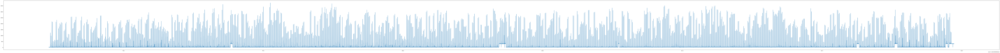

In [85]:
plt.figure(figsize=(200, 10))
hist, bin_edges = np.histogram(ts, bins=int(1e5))
plt.plot(bin_edges[:-1], hist)

In [43]:
margin = -0.05e9
delta_t = 0.1e9

for i, idx in enumerate(tqdm(cases_idx)):
    init_ts_idx = np.searchsorted(ts, cases_ts[i][0])
    fin_ts_idx = np.searchsorted(ts, cases_ts[i][0] + delta_t)
    
    i_marg = np.searchsorted(ts, cases_ts[i][0] + margin)
    f_marg = np.searchsorted(ts, cases_ts[i][0] + delta_t + margin)
    
    print(fin_ts_idx - init_ts_idx + 1, f_marg - i_marg + 1, fin_ts_idx - init_ts_idx - f_marg + i_marg)
    if i % 5 == 4:
        print()

  0%|          | 0/645 [00:00<?, ?it/s]

1854 3021 -1167
5678 4151 1527
439 1208 -769
452 1223 -771
5234 5354 -120

684 1328 -644
3191 3879 -688
4268 4563 -295
4279 4860 -581
409 981 -572

2789 3243 -454
5066 3751 1315
1538 1993 -455
1981 2475 -494
219 729 -510

7183 5547 1636
3363 3506 -143
4739 4597 142
6438 4646 1792
588 970 -382

2936 2609 327
3246 3047 199
6177 5640 537
1109 1626 -517
4951 3713 1238

368 913 -545
6253 4383 1870
4812 4186 626
713 1079 -366
3694 3615 79

2477 2799 -322
2717 3356 -639
4174 3740 434
5678 4764 914
1139 1956 -817

1098 1744 -646
7511 5499 2012
2182 2306 -124
392 1023 -631
1499 1868 -369

604 1374 -770
5766 4463 1303
1480 1900 -420
429 1099 -670
3041 3339 -298

4859 4253 606
3667 4243 -576
555 1253 -698
1061 1583 -522
5076 4106 970

5122 4496 626
3471 3589 -118
226 700 -474
2406 2778 -372
4490 3929 561

5587 4587 1000
5566 4760 806
1051 1741 -690
4111 4043 68
4052 3197 855

4485 3897 588
3347 3489 -142
2168 2580 -412
5505 5087 418
1720 2702 -982

6404 4815 1589
1804 2345 -541
1088 1721 -633
518

KeyboardInterrupt: 

In [51]:
for i, idx in enumerate(tqdm(cases_idx)):
    init_idx = idx[0]
    for j in range(-10, 11):
        time_step = contact_case_ts_alt_int[init_idx + j]
        detect, event_array = filter_events_by_time(time_step)
        print(len(event_array))
    print()
    

  0%|          | 0/645 [00:00<?, ?it/s]

3607
3601
3607
3613
3457
2867
1828
1155
1024
975
951
905
771
681
661
642
644
640
635
630
627

597
588
588
581
575
569
575
587
580
585
595
593
591
591
585
585
597
594
586
598
596

9027
9101
9124
9190
9202
9233
9240
9257
9261
9255
9258
9269
9279
9278
9267
9272
9286
9302
9312
9309
9309

2211
2222
2230
2238
2241
2080
1537
1121
1067
1054
1043
930
777
710
699
679
644
638
635
636
639

645
654
655
648
646
650
644
639
644
633
636
631
623
624
621
629
639
635
629
626
621

7934
7929
7933
7920
7924
7567
6694
4966
2813
1877
1664
1573
1471
1364
1190
997
805
664
672
668
666

604
593
586
576
564
565
557
562
578
586
590
584
585
583
592
593
583
595
594
596
591

1571
2493
3100
3328
3485
3490
3496
3509
3502
3500
3502
3501
3512
3520
3523
3524
3541
3551
3545
3555
3548

3538
3538
3538
3535
3526
3518
3517
3534
3282
2435
1246
949
878
861
865
818
742
703
677
657
625

587
588
578
578
568
576
571
586
597
595
586
587
582
589
588
597
587
579
579
577
554

4295
5987
7168
7646
7994
8081
8110
8133
8206
8244
8242
8262
82

KeyboardInterrupt: 

In [28]:
alt_arrays = []
delta_t = 0.1e9
for i, idx in enumerate(tqdm(cases_idx)):
    init_ts_idx = np.searchsorted(contact_case_ts_alt_int, cases_ts[i][0])
    #fin_ts_idx = np.searchsorted(ts, cases_ts[i][0] + delta_t)
    
    for j in range(-7, 8):
        margin_ts = contact_case_ts_alt_int[init_ts_idx + j]
        fin_ts_idx = np.searchsorted(contact_case_ts_alt_int, margin_ts + delta_t)
        n_ev = init_ts_idx + j - fin_ts_idx - 1
        print(j, -n_ev)
        
    print()
    
    #alt_arrays.append(events[init_ts_idx:fin_ts_idx+1])

  0%|          | 0/645 [00:00<?, ?it/s]

-7 1861
-6 1860
-5 1859
-4 1858
-3 1857
-2 1856
-1 1855
0 1854
1 1853
2 1852
3 1852
4 1851
5 1850
6 1849
7 1848

-7 5683
-6 5682
-5 5681
-4 5681
-3 5680
-2 5679
-1 5679
0 5679
1 5678
2 5677
3 5676
4 5676
5 5675
6 5674
7 5673

-7 446
-6 445
-5 444
-4 443
-3 442
-2 441
-1 440
0 439
1 438
2 437
3 436
4 435
5 434
6 433
7 432

-7 459
-6 458
-5 457
-4 456
-3 455
-2 454
-1 453
0 453
1 452
2 451
3 450
4 449
5 448
6 447
7 446

-7 5237
-6 5238
-5 5238
-4 5237
-3 5236
-2 5235
-1 5234
0 5234
1 5233
2 5233
3 5232
4 5231
5 5231
6 5230
7 5229

-7 690
-6 689
-5 688
-4 687
-3 687
-2 686
-1 685
0 684
1 683
2 682
3 681
4 681
5 680
6 680
7 679

-7 3198
-6 3197
-5 3196
-4 3195
-3 3194
-2 3193
-1 3192
0 3191
1 3190
2 3189
3 3188
4 3187
5 3186
6 3185
7 3185

-7 4268
-6 4267
-5 4266
-4 4265
-3 4264
-2 4268
-1 4268
0 4268
1 4267
2 4266
3 4267
4 4266
5 4265
6 4264
7 4263

-7 4283
-6 4282
-5 4281
-4 4281
-3 4280
-2 4281
-1 4280
0 4279
1 4278
2 4278
3 4277
4 4276
5 4275
6 4275
7 4274

-7 416
-6 415
-5 414
-4 413


KeyboardInterrupt: 

In [98]:
margin = -0.03e9


  0%|          | 0/645 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

In [120]:
np.argmin(n_events[0]), np.min(n_events[0])

(223, 1)

1
219
1


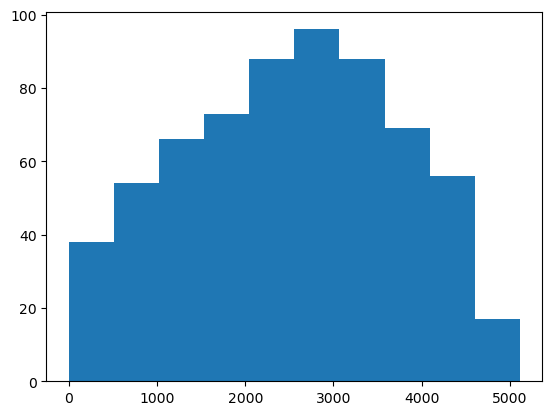

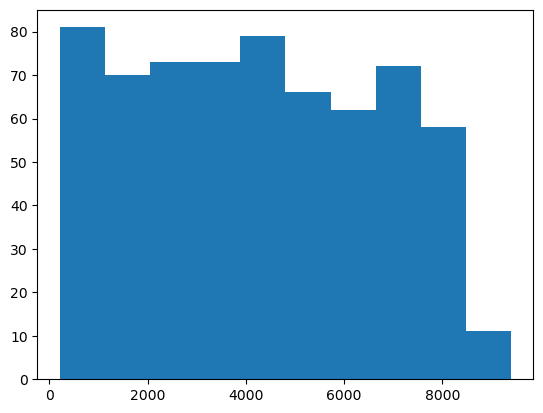

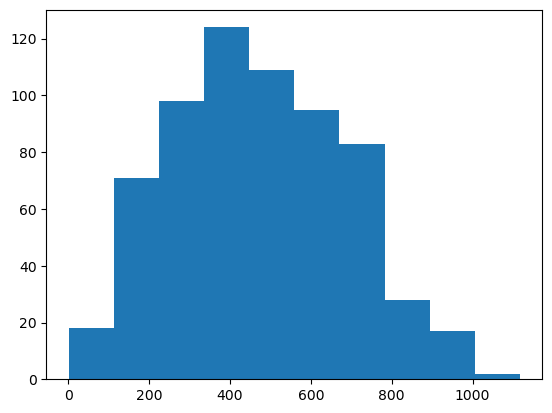

In [100]:
for dt in n_events:
    plt.figure()
    print(min(dt))
    plt.hist(dt)

In [108]:
alt_arrays = []
delta_t = 0.01e9
margin = -0.03e9
for i, idx in enumerate(tqdm(cases_idx)):
    init_ts_idx = np.searchsorted(ts, cases_ts[i][0])
    fin_ts_idx = np.searchsorted(ts, cases_ts[i][0] + delta_t)
    
    alt_arrays.append(events[init_ts_idx:fin_ts_idx+1])

  0%|          | 0/645 [00:00<?, ?it/s]

In [96]:
for i, aa in enumerate(alt_arrays):
    print(i, len(aa))

0 1389
1 3185
2 353
3 360
4 3267
5 487
6 2214
7 2732
8 2775
9 347
10 2000
11 2927
12 1138
13 1473
14 170
15 3920
16 2277
17 2944
18 3607
19 371
20 1898
21 2178
22 3534
23 882
24 2813
25 278
26 3314
27 2870
28 508
29 2371
30 1760
31 1908
32 2585
33 3306
34 871
35 803
36 3933
37 1482
38 306
39 984
40 443
41 3167
42 1062
43 314
44 2075
45 2998
46 2455
47 380
48 681
49 3013
50 3153
51 2344
52 188
53 1734
54 2724
55 3328
56 3392
57 805
58 2626
59 2494
60 2874
61 2385
62 1625
63 3300
64 1291
65 3658
66 1364
67 884
68 3174
69 3574
70 4210
71 396
72 2373
73 3011
74 3342
75 2370
76 2255
77 2806
78 2245
79 2774
80 1844
81 2303
82 253
83 1353
84 1783
85 355
86 782
87 3883
88 341
89 3413
90 1740
91 4169
92 3200
93 1991
94 3368
95 1713
96 2324
97 3156
98 3774
99 341
100 283
101 2131
102 4202
103 2066
104 2420
105 3317
106 3782
107 3027
108 2071
109 2694
110 4312
111 2080
112 3267
113 931
114 2517
115 1164
116 4294
117 4434
118 2083
119 525
120 3608
121 2803
122 1922
123 4785
124 3320
125 1661
126 1

(144, 4)


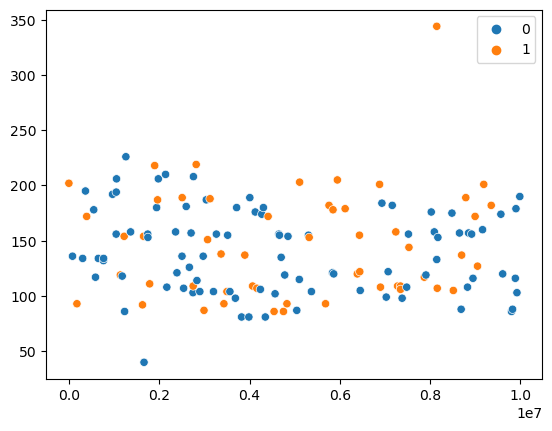

In [118]:
import seaborn as sns
def plot(ev):
    print(ev.shape)
    sns.scatterplot( x=ev[:, 2]-ev[0,2],y=ev[:, 0], hue=ev[:, 3])
    # sns.scatterplot(x=ev[:, 0], y=ev[:, 1], hue=ev[:, 3])

plot(alt_arrays[28])

<AxesSubplot:>

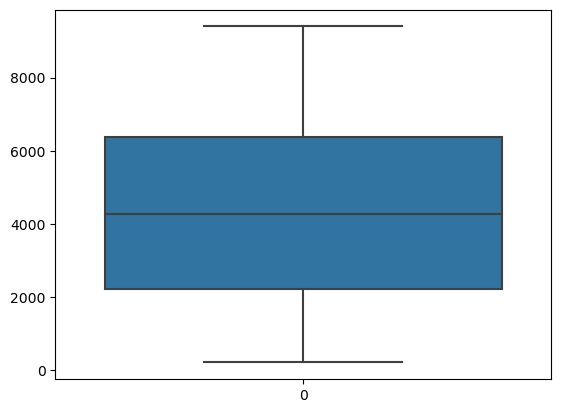

In [230]:
sns.boxplot([a.shape[0] for a in alt_arrays])

In [235]:
sum(np.array([a.shape[0] for a in alt_arrays]) < 1000)

67

In [205]:
np.sort([a.shape[0] for a in alt_arrays])

array([ 219,  226,  326,  331,  358,  368,  368,  392,  409,  417,  429,
        439,  444,  452,  453,  457,  465,  466,  503,  509,  514,  531,
        540,  555,  556,  556,  570,  576,  579,  586,  588,  588,  604,
        617,  629,  639,  683,  684,  694,  701,  704,  709,  711,  713,
        729,  732,  738,  773,  780,  796,  801,  808,  828,  833,  860,
        866,  883,  901,  904,  904,  910,  921,  926,  951,  974,  981,
        998, 1017, 1046, 1048, 1050, 1051, 1054, 1059, 1061, 1081, 1088,
       1098, 1109, 1113, 1128, 1139, 1154, 1163, 1195, 1208, 1208, 1210,
       1218, 1240, 1254, 1318, 1339, 1415, 1440, 1451, 1473, 1480, 1480,
       1492, 1499, 1516, 1537, 1538, 1542, 1551, 1576, 1579, 1584, 1591,
       1600, 1600, 1608, 1621, 1622, 1643, 1665, 1679, 1680, 1696, 1699,
       1720, 1727, 1735, 1742, 1759, 1761, 1765, 1776, 1793, 1804, 1827,
       1832, 1854, 1863, 1876, 1881, 1896, 1903, 1907, 1923, 1941, 1958,
       1981, 1987, 2008, 2012, 2021, 2022, 2030, 20

In [194]:
np.argsort([a.shape[0] for a in alt_arrays])

array([223,  14,  52, 334,  82, 430,  25, 100, 371,  38, 301,  43,  99,
        88, 305, 553,   9,   2,  85,   3, 412,  19,  47, 270,  71, 337,
       145, 216, 219, 287,  40, 437, 629, 590, 252,   5, 247,  28, 375,
       547, 119, 192, 392, 535, 254, 253, 268, 411, 621, 601, 613, 182,
       171, 239, 276, 384, 376, 314, 139, 628,  48, 188, 353, 190, 210,
       310, 136,  86, 497, 298,  35,  57, 581, 260, 341, 373, 288, 543,
       463, 367, 316,  34, 576,  23,  67, 113, 327, 155, 236, 415,  39,
       266, 433, 598, 166,  42, 154, 459, 233, 179, 607,  12, 418, 562,
       115, 640, 573, 251, 346, 570, 229, 208, 536, 185, 234, 143, 465,
       530, 345, 388, 387, 135,  64, 485, 361, 583, 187,  83,  66, 630,
       483, 501, 368,   0, 243, 320, 423, 584, 195, 184, 178, 222, 250,
       555,  13, 408,  37, 550, 631, 173, 217, 378, 183, 633, 397, 552,
       406, 444, 307, 372, 273, 244, 454, 527, 551,  62, 542, 587, 419,
       355, 125, 363, 309, 304, 634, 578, 494, 231, 461, 557, 28

<AxesSubplot:>

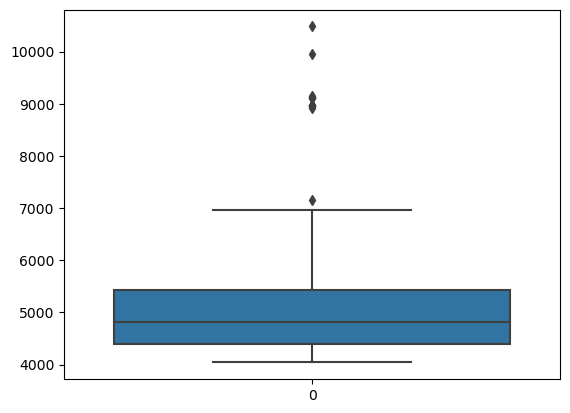

In [180]:
sns.boxplot([ev.shape[0] for ev in event_arrays])

In [149]:
delta_ts = [0.01e9, 0.05e9, 0.1e9, 0.2e9]
margin = -0.05e9

n_events_dt = []
for dt in delta_ts:
    n_ev_dt = []
    for i, idx in enumerate(tqdm(cases_idx)):
        init_ts_idx = np.searchsorted(ts, cases_ts[i][0] + margin)
        fin_ts_idx = np.searchsorted(ts, cases_ts[i][0] + dt)

        n_ev_dt.append(len(events[init_ts_idx:fin_ts_idx+1]))
    n_events_dt.append(n_ev_dt)

  0%|          | 0/645 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

  0%|          | 0/645 [00:00<?, ?it/s]

In [159]:
delta_ts = [0.01e9, 0.05e9, 0.1e9, 0.2e9]
for n_evs, dt in zip(n_events_dt, delta_ts):
    print(dt*1e-9, (dt-margin)*1e-9)
    print(np.sort(n_evs)[:15], np.argsort(n_evs)[:5], np.median(n_evs), np.max(n_evs))
    print()

0.01 0.060000000000000005
[  1 140 197 204 231 233 245 248 259 259 269 284 290 306 307] [223 477 522 505 513] 1259.0 4506

0.05 0.1
[  1 700 729 846 860 913 913 918 926 936 954 970 981 989 990] [223  52  14 547 613] 3333.0 8501

0.1 0.15000000000000002
[ 509  738  778 1003 1032 1043 1047 1064 1064 1090 1097 1109 1147 1155
 1166] [223  52  14  25 547] 5048.0 11865

0.2 0.25
[ 815  861 1078 1098 1124 1140 1145 1172 1177 1184 1214 1245 1245 1251
 1260] [ 52  14  25   9 334] 5854.0 13290



In [193]:
delta_t = 0.025e9
margin = -0.025e9
dist_from_center = lambda x, y: np.sqrt((x - 173)**2 + (y - 130)**2)
circle_rad=90
event_arrays = []
for i, idx in enumerate(tqdm(cases_idx)):
    init_ts_idx = np.searchsorted(ts, cases_ts[i][0] + margin)
    fin_ts_idx = np.searchsorted(ts, cases_ts[i][0] + delta_t)
    event_array = events[init_ts_idx:fin_ts_idx+1]
    in_circle = dist_from_center(event_array[:, 0], event_array[:, 1]) < circle_rad
    event_arrays.append(event_array[in_circle, :])

  0%|          | 0/645 [00:00<?, ?it/s]

In [194]:
np.argsort([len(a) for a in event_arrays])[:20], np.sort([len(a) for a in event_arrays])[:20]

(array([223,  52,  14,   9,  82,  88, 334,  38,  25,   2, 100,  85, 553,
          3,  99, 613, 547, 628, 598,  43]),
 array([  0, 239, 243, 399, 431, 459, 470, 487, 500, 518, 523, 540, 543,
        561, 567, 570, 573, 574, 576, 584]))

In [203]:
np.max([len(a) for a in event_arrays])

4704

(243, 4)


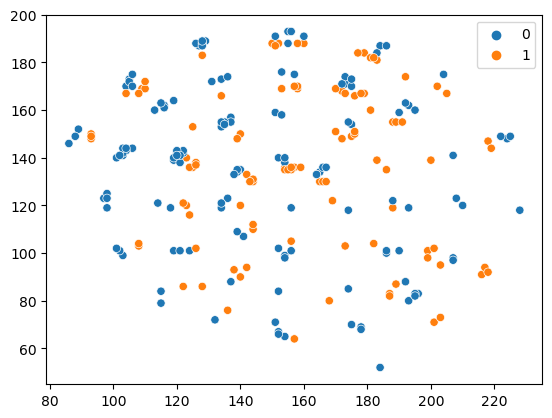

In [195]:
import seaborn as sns
def plot(ev):
    print(ev.shape)
    
    sns.scatterplot( x=ev[:, 0],y=ev[:, 1], hue=ev[:, 3])
    # sns.scatterplot(x=ev[:, 0], y=ev[:, 1], hue=ev[:, 3])
plot(event_arrays[14])

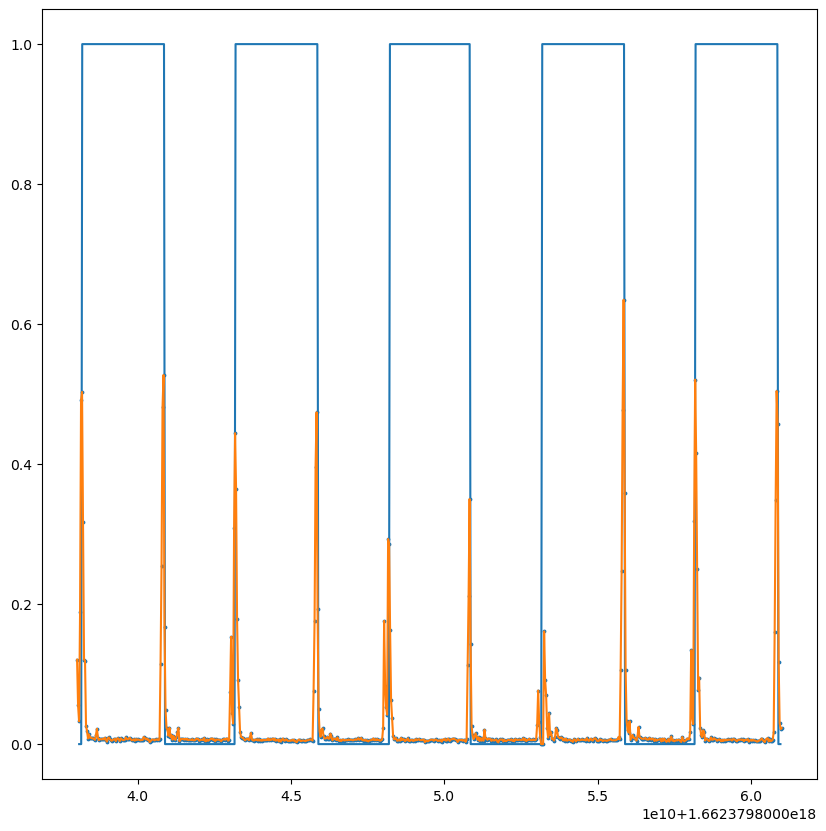

In [207]:
def plot_case(case):
    plt.figure(figsize=(10 , 10))
    all_ = cases_int_idx[5*case:5*case + 5]
    init = all_[0][0] - 3
    final = all_[-1][1] + 3
    
    plt.plot(contact_case_ts_alt_int[init:final], contact_case_alt_int[init:final] / (case+1))
    
    
    init_events = np.searchsorted(bin_edges, cases_ts[5*case:5*case + 5][0][0]) - 5
    final_events = np.searchsorted(bin_edges, cases_ts[5*case:5*case + 5][-1][1])+ 5
    
    plt.plot(bin_edges[init_events:final_events], hist[init_events:final_events] / hist.max())
    plt.scatter(bin_edges[init_events:final_events], hist[init_events:final_events] / hist.max(), s=3)
    #print(hist.max())
    
    
    
plot_case(223 // 5 )

In [139]:
44*5

220

In [180]:
477 // 5

95